***https://drive.google.com/file/d/1bLgbt4X39Hy2YUnmkICSNxet8f7wWcYg/view?usp=sharing***

Roll Number: 21100157

### VAE as Generative Model

In this part we will draw a comparison between Autoencoders and Variational Autoencoders. We will see how plain AE are good to learn a single latent representation of data but they are not good for generation when we sample from proability distribtion. On the other hand, VAE can map input data to continuous probability distribution. This distribution is normal distribution in case of VAEs. Once we learn this mapping, we can generate new images by simply taking samples from the learnt distribution. 

### Imports

In [1]:
import os
import cv2
import random
import numpy as np
from glob import glob
from scipy.stats import norm
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

import tensorflow as tf
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Input, Conv2D, Flatten, Dense, Conv2DTranspose, Reshape
from keras.layers import Lambda, Activation, BatchNormalization, LeakyReLU, Dropout
from keras.models import Model
from keras import backend as K
from keras.optimizers import Adam, SGD, Adagrad
from keras.callbacks import ModelCheckpoint 
from keras.utils import plot_model

# just a little hack so that tensorflow can accpet our custom loss function
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()

from google_drive_downloader import GoogleDriveDownloader as gdd
import os.path
import os
from random import shuffle
import random
import copy
from matplotlib import pyplot

### Loading, Unzipping and Displaying the Dataset

Mounting your google drive.

In [2]:
from google.colab import drive
drive.mount('/drive')

Mounted at /drive


Downloading dataset

In [3]:
# Dataset link: https://tinyurl.com/hw04dataset
if not os.path.isfile('/content/ffhq-dataset.zip'):
  gdd.download_file_from_google_drive(file_id='1lhIylJPa9H3yS0iGyYZqK01JtYRQvjr1', dest_path='/content/ffhq-dataset.zip', unzip=False)

Unzipping the data file to load it locally in the colab runtime. You can see your unzipped files by clicking the folder icon on left side of your colab.

In [4]:
# replace this your google drive path of the zip file of dataset provided with this homework
if not os.path.isdir('/content/data'):
  !unzip -o -q "/content/ffhq-dataset.zip" -d "/content/data/"

In [5]:
DATA_FOLDER = '/content/data/'

filenames = np.array(glob(os.path.join(DATA_FOLDER, '*/*.png')))
NUM_IMAGES = len(filenames)
print("Total number of images : " + str(NUM_IMAGES))

Total number of images : 70000


The dataset is quite large (70000 images) which makes it impossible to load it all at the same time in computer memory. We will use Keras' <i>ImageDataGenerator</i> object and call its member function - <i>flow_from_directory</i> to define the flow of data directly from disk rather than loading the entire dataset into memory. You can also apply various transformations (for augmentation) to the images directly while loading the data (e.g normalizing, rescaling, rotating etc).


You can read more about this in official Keras [documentation](https://keras.io/preprocessing/image/#flow_from_directory).

Below we have setup everything you need for this dataset. You will need to pass <i>data_flow</i> object to <i>fit</i> functions later when training your model.

In [6]:
INPUT_DIM = (128, 128, 3) # Image dimension
Z_DIM = 700            # Dimension of the latent vector (z) [Specify your latent_vector dimension here]

In [7]:
'''
Copy pasted these functions from part 1
'''

def preprocessing_norm(images):
  return np.divide(images, 255)

###########################################################################

def draw_square_on_image(image):
    output_img = copy.deepcopy(image)
    s1_rand = random.randint(0, 100)
    s1 = s1_rand
    s2 = s1 + 28
    e1_rand = random.randint(0, 100)
    e1 = e1_rand
    e2 = e1 + 28
    output_img[s1 : s2, e1 : e2] = (0, 0, 0)
    return output_img

###########################################################################

def custom_image_generator(files, data_instances, batch_size = 64):
  while True:
    proc_batch = []
    batch_input = []
    shuffle(files)
    for i in range(len(files)):
      img = cv2.imread(files[i])
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
      proc_batch.append(img)
      temp = copy.deepcopy(img)
      addSquare = draw_square_on_image(temp)
      batch_input.append(addSquare)
      if (len(proc_batch) == batch_size):
        proc_batch = preprocessing_norm(proc_batch)
        batch_input = preprocessing_norm(batch_input)
        corrupted_images_batch = np.array(batch_input)
        original_images_batch = np.array(proc_batch)
        yield (corrupted_images_batch, original_images_batch)
        proc_batch = []
        batch_input = []

In [8]:
data_flow = custom_image_generator(filenames, 7000)

Utility function to display grid of images.

In [9]:
def display_image_grid(images, num_rows, num_cols, title_text):

    fig = plt.figure(figsize=(num_cols*3., num_rows*3.), )
    grid = ImageGrid(fig, 111, nrows_ncols=(num_rows, num_cols), axes_pad=0.15)

    for ax, im in zip(grid, images):
        ax.imshow(im)
        ax.axis("off")
    
    plt.suptitle(title_text, fontsize=20)
    plt.show()

Displaying some samples images from the dataset.

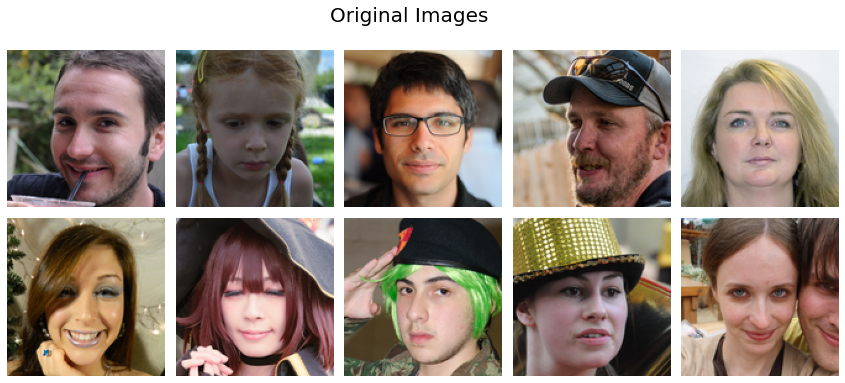

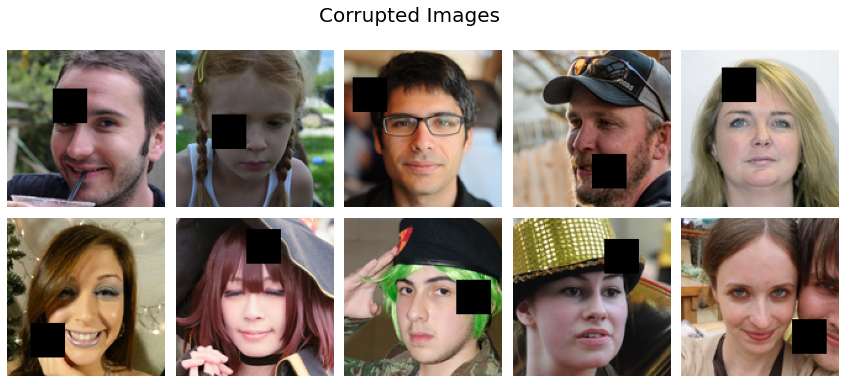

In [14]:
# get first batch of images
(corrupted_images_batch, orig_images_batch) = next(data_flow)

# only displaying 10 images from both batch
display_image_grid(orig_images_batch[:10], 2, 5, "Original Images")
display_image_grid(corrupted_images_batch[:10], 2, 5, "Corrupted Images")

## AUTOENCODER

#### Encoder

Below you will create the model for your encoder just like the one in Image Completion task (but not necessarily that same). The architecture of the Encoder consists of a stack of convolutional layers followed by a dense (fully connected) layer which outputs a vector of size <i>Z_DIM</i>. The whole image of size 128x128x3 is decoed into this latent space vector of size <i>Z_DIM</i>.


NOTE: You can experiment with the number of feature maps, kernel size, strides and number of conv layer.

In [15]:
ae_encoder = None # initialized below
ae_encoder_input = Input(shape=INPUT_DIM, name='ae_encoder_input')
ae_encoder_output = None # initialized below


######################## WRITE YOUR CODE BELOW ########################

filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
ae = ae_encoder_input

for i in range(4):
  ae = Conv2D(filters = filters[i], 
             kernel_size = kernels[i], 
             strides = strides[i], 
             padding = 'same', 
             name = 'ae_encoder_input_conv_layer' + str(i))(ae)
  ae = LeakyReLU()(ae)

latentVectorReshaperHelper = K.int_shape(ae)[1:] 
ae = Flatten()(ae)

ae_encoder_output = Dense(Z_DIM, name='ae_encoder_output_dense_layer')(ae)

ae_encoder = Model(inputs=ae_encoder_input, outputs=ae_encoder_output)

########################### END OF YOUR CODE ##########################

ae_encoder.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ae_encoder_input (InputLayer [(None, 128, 128, 3)]     0         
_________________________________________________________________
ae_encoder_input_conv_layer0 (None, 64, 64, 35)        980       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 64, 64, 35)        0         
_________________________________________________________________
ae_encoder_input_conv_layer1 (None, 32, 32, 70)        22120     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 70)        0         
_________________________________________________________________
ae_encoder_input_conv_layer2 (None, 16, 16, 105)       66255     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 105)       0     

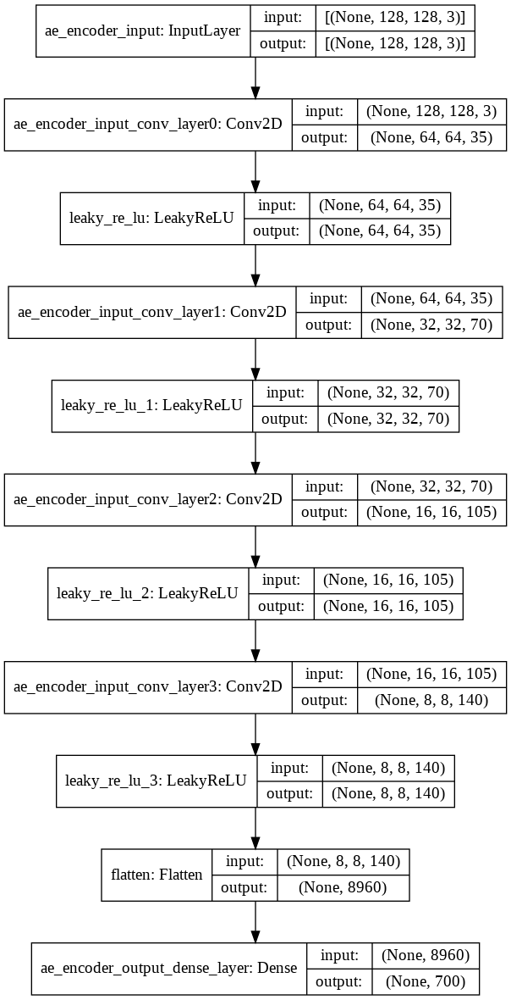

In [16]:
tf.keras.utils.plot_model(ae_encoder, show_shapes=True)

#### Decoder

Just like the encoder you will create the model for the decoder. This model can be the exact mirror of encoder model, but that is not mandatory.

Since the function of the Decoder to reconstruct the image from the latent vector. Therefore, it is necessary to define the decoder so as to increase the size of the activations gradually through the network. This can be achieved through the  [Conv2DTransponse](https://keras.io/layers/convolutional/#conv2dtranspose) layer. This layer produces an output tensor double the size of the input tensor in both height and width.

Again, you can experiment with the number of feature maps, kernel size, strides and number of conv layer.


In [17]:
######################## WRITE YOUR CODE BELOW ########################

ae_decoder = None # initialized below
ae_decoder_output = None # initialized below

filters = [105, 70, 35, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

ae_decoder_input = Input(shape=(Z_DIM,), name='ae_decoder_input')
ae = Dense(np.prod(latentVectorReshaperHelper))(ae_decoder_input)
ae = Reshape(latentVectorReshaperHelper)(ae)

for i in range(4):
  ae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'ae_decoder_output_dense_layer' + str(i))(ae)
  if i < 4 - 1:
    ae = LeakyReLU()(ae)
  else:
    ae = Activation('sigmoid')(ae)

ae_decoder_output = ae
ae_decoder = Model(inputs=ae_decoder_input, outputs=ae_decoder_output)

########################### END OF YOUR CODE ##########################

ae_decoder.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ae_decoder_input (InputLayer [(None, 700)]             0         
_________________________________________________________________
dense (Dense)                (None, 8960)              6280960   
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 140)         0         
_________________________________________________________________
ae_decoder_output_dense_laye (None, 16, 16, 105)       132405    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 16, 16, 105)       0         
_________________________________________________________________
ae_decoder_output_dense_laye (None, 32, 32, 70)        66220     
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 32, 32, 70)        0   

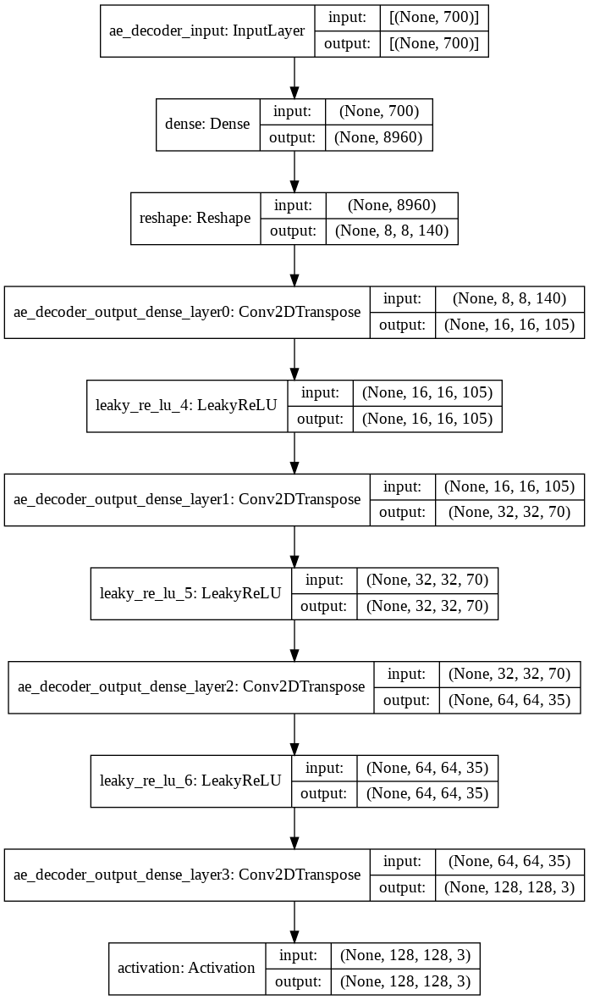

In [18]:
tf.keras.utils.plot_model(ae_decoder, show_shapes=True)

#### Attaching the Decoder to the Encoder

Finally, here we connect the encoder to the docoder.

In [19]:
autoencoder_model = None # initialized below

######################## WRITE YOUR CODE BELOW ########################

# The input of the autoencoder will be the same as of encoder
ae_input = ae_encoder_input

# The output of the autoencoder will be the output of decoder, when passed encoder input
ae_output = ae_decoder(ae_encoder_output)

# Input to the combined model will be the input to the encoder.
# Output of the combined model will be the output of the decoder.
autoencoder_model = Model(inputs=ae_input, outputs=ae_output)

########################### END OF YOUR CODE ##########################

autoencoder_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
ae_encoder_input (InputLayer [(None, 128, 128, 3)]     0         
_________________________________________________________________
ae_encoder_input_conv_layer0 (None, 64, 64, 35)        980       
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 64, 64, 35)        0         
_________________________________________________________________
ae_encoder_input_conv_layer1 (None, 32, 32, 70)        22120     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 70)        0         
_________________________________________________________________
ae_encoder_input_conv_layer2 (None, 16, 16, 105)       66255     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 105)       0   

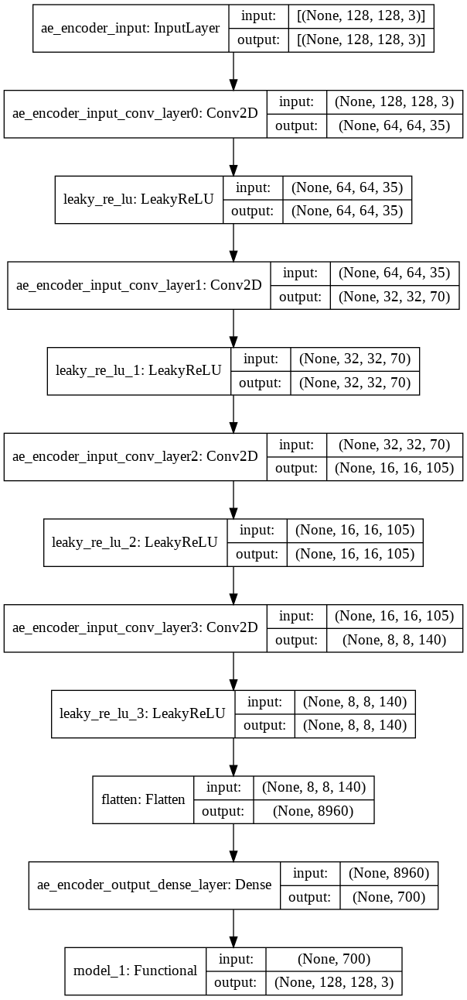

In [20]:
tf.keras.utils.plot_model(autoencoder_model, show_shapes=True)

### Training the AE

The hyperparameters are the same as given in the Image Completion task.

Also for training, you can use <i>Adam</i> optimizer with the learning rate given below (or you can try out your own).

The number of epochs given are 10, but experiment with that number to know where you can acheive the best results.

In [21]:
LEARNING_RATE = 0.003
N_EPOCHS = 10
BATCH_SIZE = 500 # batch of images returned by image generator

######################## WRITE YOUR CODE BELOW ########################

# create custom_data_generator here
training = custom_image_generator(filenames, 7000)

# compile your model here
optimizer = Adam(lr=LEARNING_RATE)
autoencoder_model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mse'])

########################### END OF YOUR CODE ##########################

Now simply call the <i>fit</i> function of the model with the appropriate paramters.

In [22]:
######################## WRITE YOUR CODE BELOW ########################

hist = autoencoder_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

########################### END OF YOUR CODE ##########################

Epoch 1/10
140/140 [==============================] - 40s 64ms/step - batch: 69.5000 - size: 64.0000 - loss: 0.0702 - mse: 0.0702
Epoch 2/10
140/140 [==============================] - 10s 70ms/step - batch: 69.5000 - size: 64.0000 - loss: 0.0327 - mse: 0.0327
Epoch 3/10
140/140 [==============================] - 10s 68ms/step - batch: 69.5000 - size: 64.0000 - loss: 0.0220 - mse: 0.0220
Epoch 4/10
140/140 [==============================] - 10s 68ms/step - batch: 69.5000 - size: 64.0000 - loss: 0.0177 - mse: 0.0177
Epoch 5/10
140/140 [==============================] - 10s 68ms/step - batch: 69.5000 - size: 64.0000 - loss: 0.0153 - mse: 0.0153
Epoch 6/10
140/140 [==============================] - 9s 68ms/step - batch: 69.5000 - size: 64.0000 - loss: 0.0136 - mse: 0.0136
Epoch 7/10
140/140 [==============================] - 9s 68ms/step - batch: 69.5000 - size: 64.0000 - loss: 0.0124 - mse: 0.0124
Epoch 8/10
140/140 [==============================] - 10s 70ms/step - batch: 69.5000 - size:

Mean Squared Error:  0.010135734




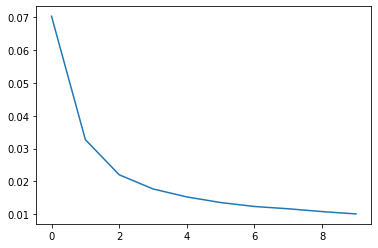

In [23]:
print('Mean Squared Error: ', hist.history['mse'][-1])

print('')
print('')

pyplot.plot(hist.history['mse'])

### Reconstruction

Now we will get a batch of images from ImageDataGenerator object and try to reconstruct the images after passing it through our autoencoder.

The first image grid shows the original images and the second grid shows the reconstructed images after passing it through the AE.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


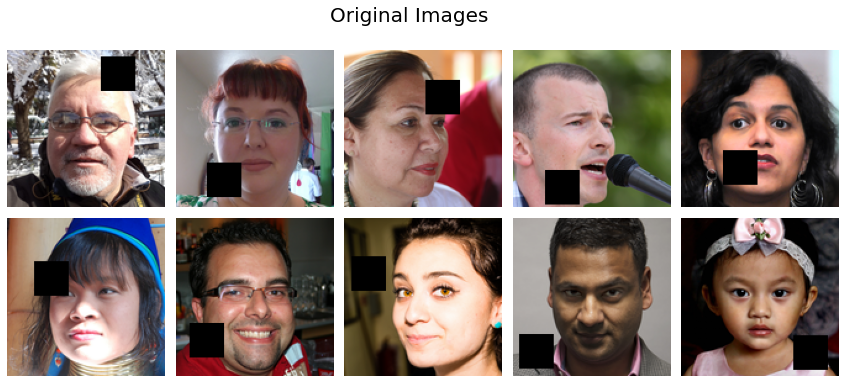

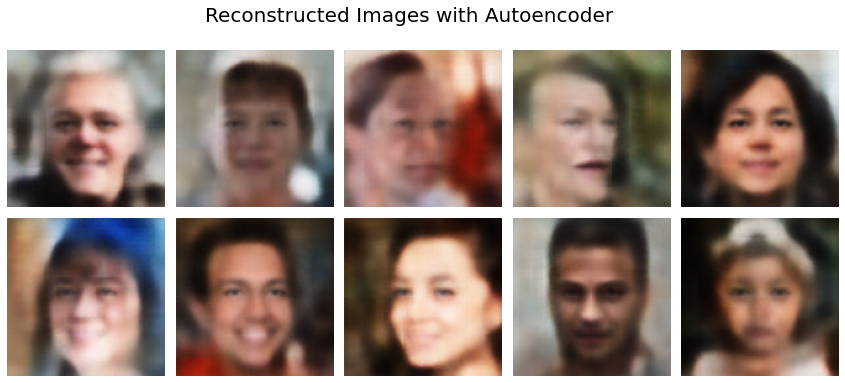

In [24]:
test_batch = next(data_flow)[0]
test_images = test_batch[:10]

reconst_images = autoencoder_model.predict(test_images)

display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Autoencoder")

<i>NOTE:</i> The reason that you are seeing the reconstructed images as blurry because MSE averages out the differences between individual pixel values. GANs (which you will see in the next assignment) on the other hand produces much sharper results. 

Adding noise before decoding the images

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


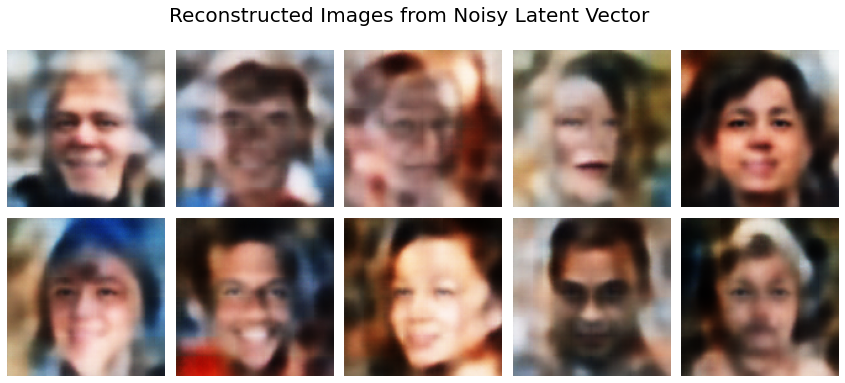

In [25]:
num_of_images = 10

# encoding our images
encodings = ae_encoder.predict(test_images)

# adding random normal noise to the encoded latent vectors
encodings += np.random.normal(0.0, 1.0, size = (num_of_images, Z_DIM))

# reconstruct from noisy latent vector
reconst_images_noisy = ae_decoder.predict(encodings)

display_image_grid(reconst_images_noisy, 2, 5, "Reconstructed Images from Noisy Latent Vector")

It can be observed that the images are starting to get distorted with a bit of noise added to its encodings. One possible reason could be that the model did not ensure that the space around the encoded values (latent space) was continuous. We will see later how to overcome this with the help of Variational Autoencoder.

### Generation 
Generate images from latent vectors sampled from a standard normal distribution

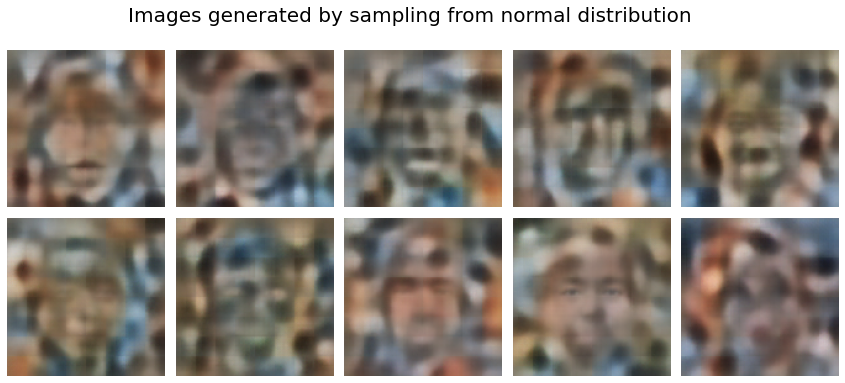

In [26]:
reconst_images = ae_decoder.predict(np.random.normal(0,1,size=(num_of_images, Z_DIM)))

display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

It is evident that the latent vector sampled from a standard normal distribution can not be used to generate new faces. This shows that the latent vectors generated by the model are not centered/symmetrical around the origin. This also strengthens our inference that the latent space is not continuous.

Since we do not have a definite distribution to sample latent vectors from, it is unclear as to how we can generate new faces. We observed that adding a bit of noise to the latent vector does not produce new faces. We can encode and decode images but that does not meet our objective of learning the joing distribution of data. 

Building on this thought, wouldn't it be great if we could generate new faces from latent vectors sampled from a standard normal distribution? This is essentially what a Variational Autoencoder does.

## VARIATIONAL AUTOENCODER



Variational Autencoders tackle most of the problems discussed above. They are trained to generate new faces from latent vectors sampled from a standard normal distribution. While a Simple Autoencoder learns to map each image to a fixed point in the latent space, the Encoder of a Variational Autoencoder (VAE) maps each image to a z-dimensional standard normal distribution. 



Here is a high level overview of what a Variational Autoencoder does.

<br>
<img src="https://blog.bayeslabs.co/assets/img/vae.jpg"> 
<br><i>Source : blog.bayeslabs.co/2019/06/04/All-you-need-to-know-about-Vae</i>

#### Encoder

The encoder for the Variational AE is little trickier than the simple autoencoder.  While a Simple Autoencoder learns to map each image to a fixed point in the latent space, the Encoder of a Variational Autoencoder (VAE) maps each image to a z-dimensional standard normal distribution. It will loos something like this:

<center>

![picture](https://drive.google.com/uc?export=view&id=1e3iGHK0s83O-RjpbRkO4OWKU52B5kS2I)

</center>

You will need Keras' functional API to make this type of model as this is not a simple feed forward network. You can read and learn more about Function API [here](https://keras.io/guides/functional_api/).

The input to the Decoder, as shown in the image above is a vector sampled from the normal distribution represented by the output of the Encoder - $\mu$ and $\sigma$. This sampling can be done as follows:

<center>
$Z = \mu + \sigma\varepsilon$
</center>

where $\varepsilon$ is a sampled from a multivariate standard normal distribution.


In [18]:
Z_DIM = 800

In [19]:
mean_mu = None
var = None
vae_encoder_input = Input(shape=INPUT_DIM, name='vae_encoder_input')
vae_encoder = None
vae_encoder_output = None

######################## WRITE YOUR CODE BELOW ########################

# define your convolution layers here

filters = [40, 80, 120, 160]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae = vae_encoder_input

for i in range(4):
  vae = Conv2D(filters=filters[i], kernel_size=kernels[i], strides=strides[i], padding='same', name='vae_encoder_input_conv_layer' + str(i))(vae)
  vae = LeakyReLU()(vae)

latentVectorReshaperHelper = K.int_shape(vae)[1:]
vae = Flatten()(vae)

# define mean and var dense layers outputed by your model

mean_mu = Dense(Z_DIM, name='mean_mu')(vae)
var = Dense(Z_DIM, name='var')(vae)

########################### END OF YOUR CODE ##########################

# here is your model outputing mu and var seperately
# now we will take samples from these paramters of distributions
# and these samples will be our latent vector, which 
# can be feed to our decoder


# Defining a function for sampling
# this function takes mean and var vectors and 
def sample_from_distribution(args):
  mean_mu, var = args
  epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
  return mean_mu + K.exp(var/2)*epsilon   
  
# Using a Keras Lambda Layer to include the sampling function as a layer in the model
vae_encoder_output = Lambda(sample_from_distribution, name='encoder_output')([mean_mu, var])

vae_encoder = Model(vae_encoder_input, vae_encoder_output)
vae_encoder.summary()

Model: "model_21"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 40)   1120        vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu_49 (LeakyReLU)      (None, 64, 64, 40)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 80)   28880       leaky_re_lu_49[0][0]             
___________________________________________________________________________________________

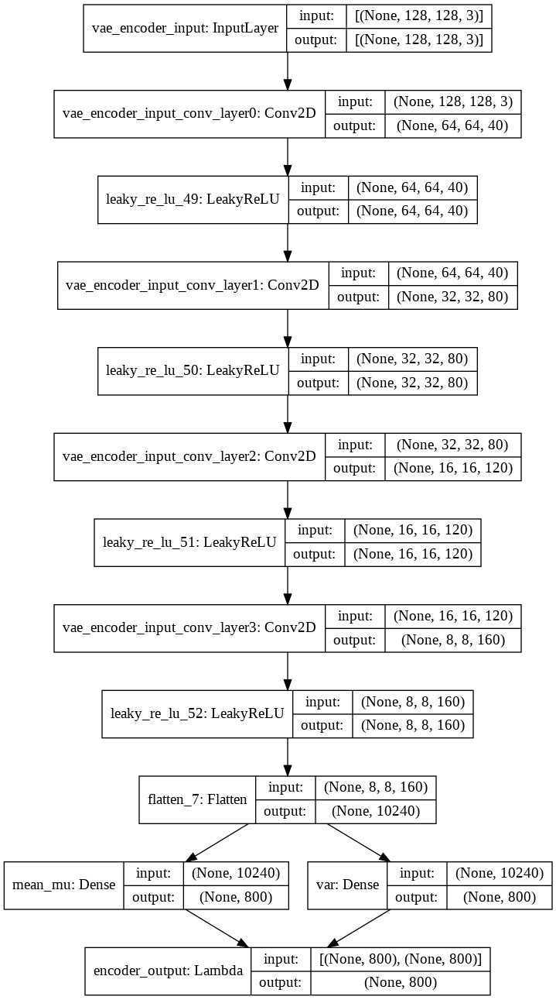

In [20]:
tf.keras.utils.plot_model(vae_encoder, "vae_encoder.png", show_shapes=True)

#### Decoder
Since the Decoder remains the same, you can use the same architecture of the decoder of Autoencoder.

In [21]:
vae_decoder = None # initialized below
vae_decoder_output = None # initialized below

######################## WRITE YOUR CODE BELOW ########################

filters = [120, 80, 40, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

vae_decoder_input = Input(shape=(Z_DIM,), name='vae_decoder_input')
vae = Dense(np.prod(latentVectorReshaperHelper))(vae_decoder_input)
vae = Reshape(latentVectorReshaperHelper)(vae)

for i in range(4):
  vae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'vae_decoder_output_dense_layer' + str(i))(vae)
  if i < 4 - 1:
    vae = LeakyReLU()(vae)
  else:
    vae = Activation('sigmoid')(vae)

vae_decoder_output = vae
vae_decoder = Model(inputs=vae_decoder_input, outputs=vae_decoder_output)

########################### END OF YOUR CODE ##########################

vae_decoder.summary()

Model: "model_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vae_decoder_input (InputLaye [(None, 800)]             0         
_________________________________________________________________
dense_7 (Dense)              (None, 10240)             8202240   
_________________________________________________________________
reshape_7 (Reshape)          (None, 8, 8, 160)         0         
_________________________________________________________________
vae_decoder_output_dense_lay (None, 16, 16, 120)       172920    
_________________________________________________________________
leaky_re_lu_53 (LeakyReLU)   (None, 16, 16, 120)       0         
_________________________________________________________________
vae_decoder_output_dense_lay (None, 32, 32, 80)        86480     
_________________________________________________________________
leaky_re_lu_54 (LeakyReLU)   (None, 32, 32, 80)        0  

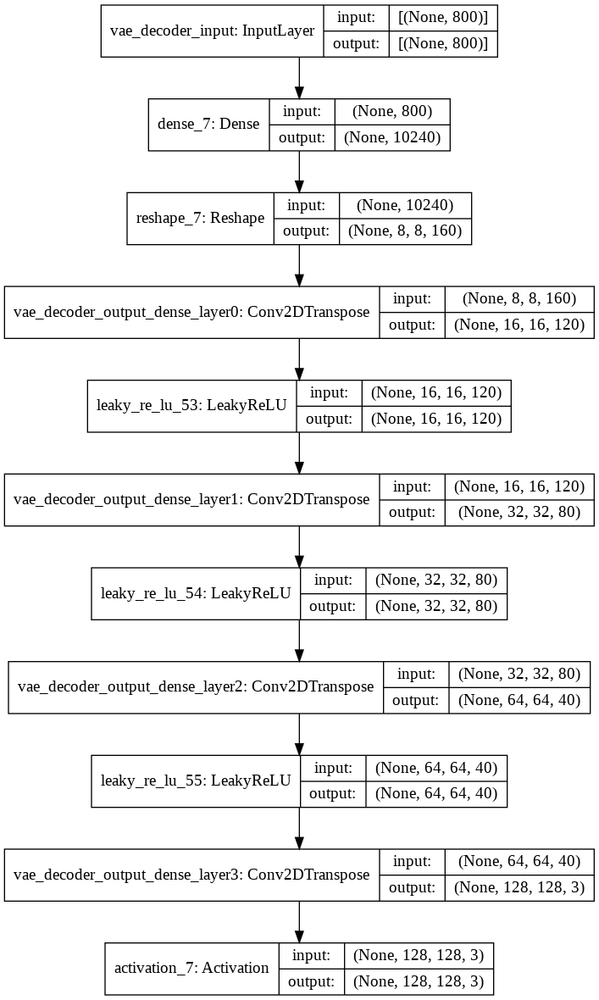

In [22]:
tf.keras.utils.plot_model(vae_decoder, show_shapes=True)

#### Attaching the Decoder to the Encoder

Just like in the case of autoencoder, you will connect your encoder with docer and make the final model.


In [23]:
######################## WRITE YOUR CODE BELOW ########################

vae_model = None

# The input to the model will be the image fed to the encoder.
vae_input = vae_encoder_input

# Output will be the output of the decoder. The term - decoder(encoder_output) 
# combines the model by passing the encoder output to the input of the decoder.
vae_output = vae_decoder(vae_encoder_output)

# Input to the combined model will be the input to the encoder.
# Output of the combined model will be the output of the decoder.
vae_model = Model(inputs=vae_input, outputs=vae_output)

########################### END OF YOUR CODE ##########################

vae_model.summary()

Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 40)   1120        vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu_49 (LeakyReLU)      (None, 64, 64, 40)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 80)   28880       leaky_re_lu_49[0][0]             
___________________________________________________________________________________________

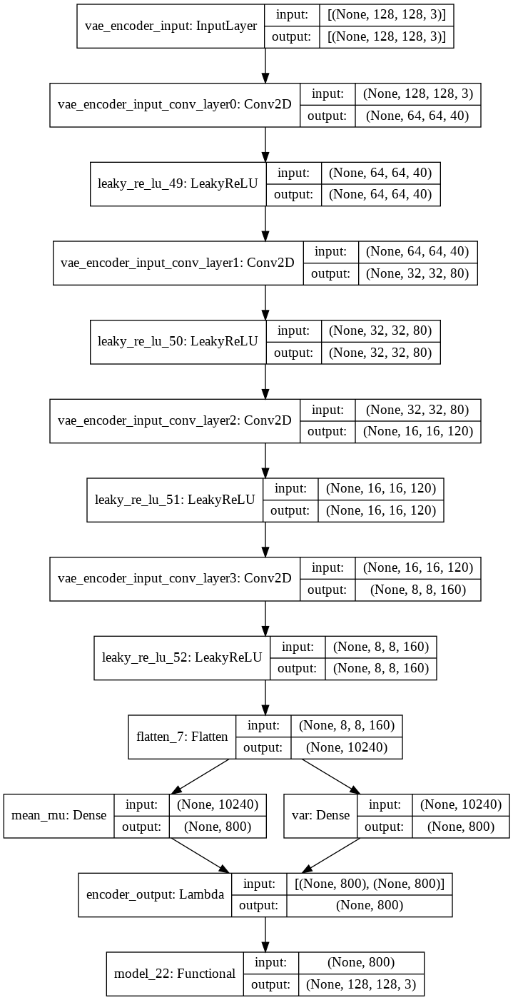

In [24]:
tf.keras.utils.plot_model(vae_model, show_shapes=True)

### Loss Function

The loss function is a sum of MSE and KL Divergence. MSE error contorls the quality of images (as already seen in the simple autoencoder) while including the KL divergence loss in addition to the MSE loss, the VAE is forced to ensure that the encodings are very similar to a multivariate standard normal distribution. Since a multivariate standard normal distribution has a zero mean, it is centered around the origin. Mapping each image to a standard normal distribution as opposed to a fixed point ensures that the latent space is continuous and the latent vectors are centered around the origin. Here is equation of KL loss, where <b>$\mu$</b> and <b>$\sigma$</b> are the vectors returned by encoder.

<br>
<center>
$D_{KL}[N(\mu,\sigma) \ || \ N(0,1)] = \frac{1}{2}\sum_{i=1}^{z}(1+\log(\sigma_i^2) - \mu_i^2 - \sigma_i^2)$
</center>
</br>

A weight (loss factor) is assigned to the MSE loss. This penalizes the model by loss factor more than KL Diverge to ensure that images produced are of good quality. If we make this loss factor small, the images will be not of good quality. If we make this loss factor large, then our model will simply act as a simple AE.

Hence, this (loss_factor) is also a hyperparamter that you need to take care of. 

Here is the [link](https://keras.io/api/losses/) to Keras documentation on how to create custom loss functions. 

In [25]:
def total_loss(y_true, y_pred):

    mean_vector = mean_mu   # mean vector outputed by encoder
    var_vector = var        # var vector outputed by encoder
    mse_loss = 0
    kl_loss = 0 

    ######################## WRITE YOUR CODE BELOW ########################

    # calculate mse loss here
    mse_loss = K.mean((y_pred - y_true) ** 2)

    # calculate kl loss here
    kl_loss =  K.sum(1 + var_vector - K.square(mean_vector) - K.exp(var_vector ), axis = 1)
    kl_loss = -0.5 * kl_loss

    ########################### END OF YOUR CODE ##########################

    return LOSS_FACTOR * mse_loss + kl_loss

The loss function is a sum of RMSE and KL Divergence. A weight is assigned to the RMSE loss, known as the loss factor. The loss factor is multiplied with the RMSE loss. If we use a high loss factor, the drawbacks of a Simple Autoencoder start to appear. However, if we use a loss factor too low, the quality of the reconstructed images will be poor. Hence the loss factor is a hyperparameter that needs to be tuned.

In [26]:
LEARNING_RATE = 0.005
N_EPOCHS = 20
LOSS_FACTOR = 13000
BATCH_SIZE = 450

### Training the VAE


Compile your model below.

In [27]:
######################## WRITE YOUR CODE BELOW ########################

training = custom_image_generator(filenames, 7000)
optimizer = Adagrad(lr=LEARNING_RATE)
vae_model.compile(optimizer=optimizer, loss=total_loss, metrics=['mse'])

########################### END OF YOUR CODE ##########################

Now call fit function on your model with appropriate paramters.

In [28]:
######################## WRITE YOUR CODE BELOW ########################

hist = vae_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

########################### END OF YOUR CODE ##########################

Epoch 1/20
155/155 [==============================] - 11s 62ms/step - batch: 77.0000 - size: 64.0000 - loss: 732.4976 - mse: 0.0542
Epoch 2/20
155/155 [==============================] - 10s 66ms/step - batch: 77.0000 - size: 64.0000 - loss: 464.7353 - mse: 0.0319
Epoch 3/20
155/155 [==============================] - 10s 66ms/step - batch: 77.0000 - size: 64.0000 - loss: 425.3172 - mse: 0.0282
Epoch 4/20
155/155 [==============================] - 10s 66ms/step - batch: 77.0000 - size: 64.0000 - loss: 402.8283 - mse: 0.0261
Epoch 5/20
155/155 [==============================] - 10s 65ms/step - batch: 77.0000 - size: 64.0000 - loss: 392.7066 - mse: 0.0250
Epoch 6/20
155/155 [==============================] - 10s 65ms/step - batch: 77.0000 - size: 64.0000 - loss: 381.7271 - mse: 0.0240
Epoch 7/20
155/155 [==============================] - 10s 66ms/step - batch: 77.0000 - size: 64.0000 - loss: 377.4994 - mse: 0.0236
Epoch 8/20
155/155 [==============================] - 10s 67ms/step - batch:

Mean Squared Error:  0.018874703




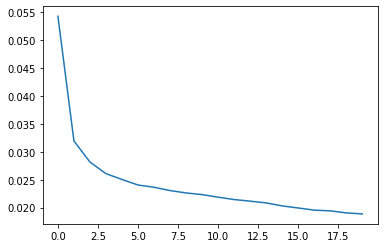

In [29]:
print('Mean Squared Error: ', hist.history['mse'][-1])

print('')
print('')

pyplot.plot(hist.history['mse'])

### Reconstruction
The reconstruction process is the same as that of the Simple Autoencoder.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


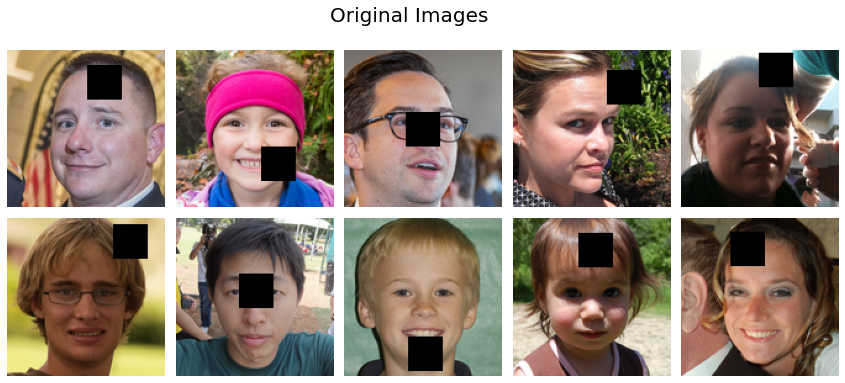

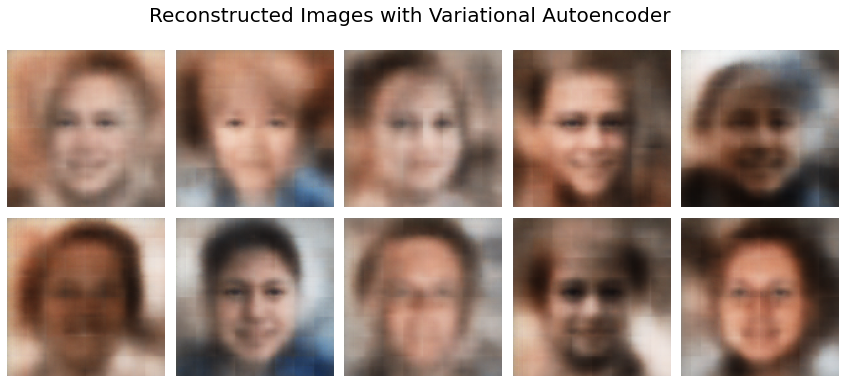

In [30]:
test_gen = custom_image_generator(filenames, NUM_IMAGES)

test_batch = next(test_gen)[0]
test_images = test_batch[:10]

reconst_images = vae_model.predict(test_images)

display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Variational Autoencoder")

###Generation
Generating new faces from random vectors sampled from a standard normal distribution. 

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


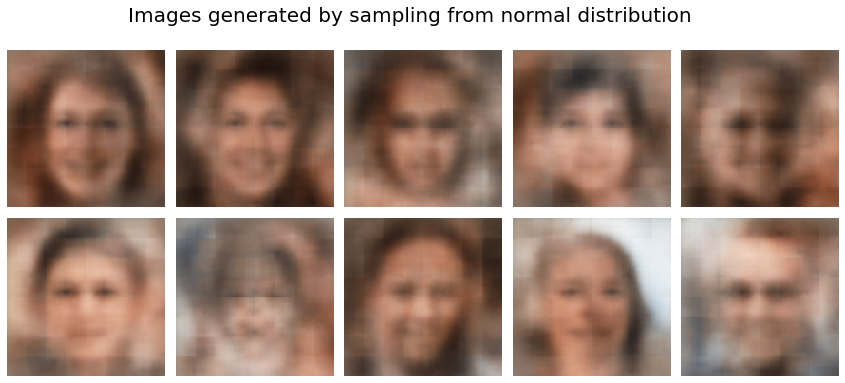

In [31]:
reconst_images = vae_decoder.predict(np.random.normal(0,1,size=(10, Z_DIM)))

display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

The VAE is evidently capable enough of producing new faces from vectors samped from a standard normal distribution. The fact that a neural network is capable of generating new faces from random noise shows how powerful it is in performing extremely complex mappings!

## REPORT

Report your results for different values of <b>Z_DIM</b>, <b>learning rate</b>, <b>optimizers</b>, <b> encoder and decoder model and Loss Factor</b> and tell us for which configuration you acheived the best results (The best run model should be the last run model in this notebook, showing the results in the cell above).

Answer:

## Model 1

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 35)   980         vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu (LeakyReLU)         (None, 64, 64, 35)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 70)   22120       leaky_re_lu[0][0]                
____________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


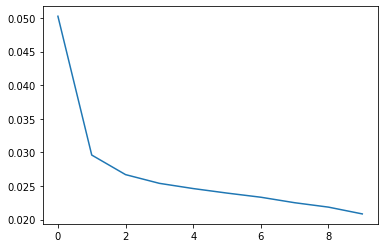

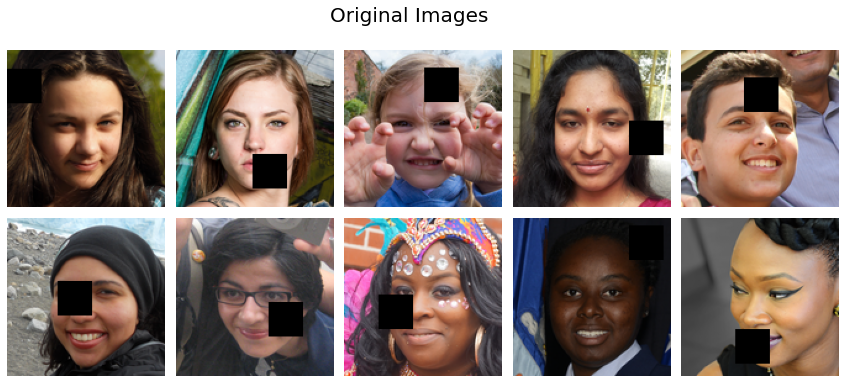

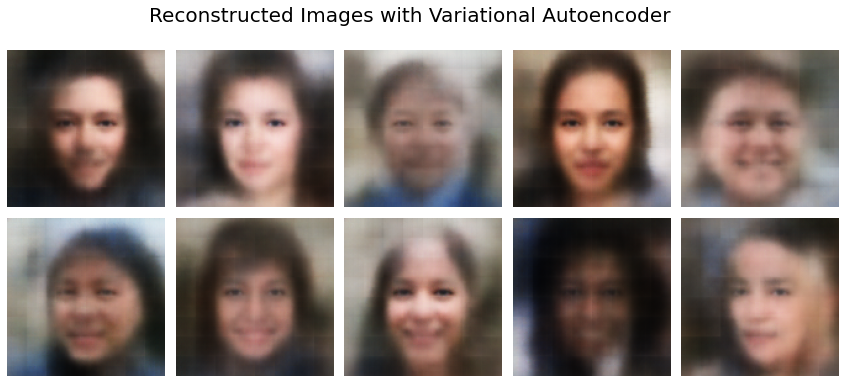

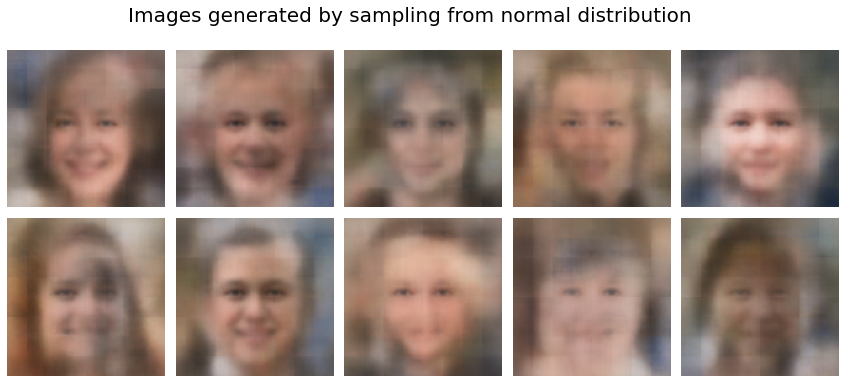

In [11]:
'''
INPUT_DIM = (128, 128, 3)
Z_DIM = 700
Number of Conv Layers = 4

-> for encoder
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

-> for decoder
filters2 = [105, 70, 35, 3]
kernels2 = [3, 3, 3, 3]
strides2 = [2, 2, 2, 2]

-> compiling and training
Optimizer = Adam
Learning Rate = 0.003
Epochs = 10
batch_size = 500

LOSS_FACTOR = 10000
'''


Z_DIM = 700

# Encoder
mean_mu = None
var = None
vae_encoder_input = Input(shape=INPUT_DIM, name='vae_encoder_input')
vae_encoder = None
vae_encoder_output = None
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae = vae_encoder_input
for i in range(4):
  vae = Conv2D(filters=filters[i], kernel_size=kernels[i], strides=strides[i], padding='same', name='vae_encoder_input_conv_layer' + str(i))(vae)
  vae = LeakyReLU()(vae)
latentVectorReshaperHelper = K.int_shape(vae)[1:]
vae = Flatten()(vae)
mean_mu = Dense(Z_DIM, name='mean_mu')(vae)
var = Dense(Z_DIM, name='var')(vae)
def sample_from_distribution(args):
  mean_mu, var = args
  epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
  return mean_mu + K.exp(var/2)*epsilon   
vae_encoder_output = Lambda(sample_from_distribution, name='encoder_output')([mean_mu, var])
vae_encoder = Model(vae_encoder_input, vae_encoder_output)

# Decoder
vae_decoder = None
vae_decoder_output = None
filters = [105, 70, 35, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae_decoder_input = Input(shape=(Z_DIM,), name='vae_decoder_input')
vae = Dense(np.prod(latentVectorReshaperHelper))(vae_decoder_input)
vae = Reshape(latentVectorReshaperHelper)(vae)
for i in range(4):
  vae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'vae_decoder_output_dense_layer' + str(i))(vae)
  if i < 4 - 1:
    vae = LeakyReLU()(vae)
  else:
    vae = Activation('sigmoid')(vae)
vae_decoder_output = vae
vae_decoder = Model(inputs=vae_decoder_input, outputs=vae_decoder_output)

# Connect Encoder and Decoder
vae_model = None
vae_input = vae_encoder_input
vae_output = vae_decoder(vae_encoder_output)
vae_model = Model(inputs=vae_input, outputs=vae_output)

# Printing Summary
vae_model.summary()
print('')
print('')

# Hyper Params
LEARNING_RATE = 0.003
N_EPOCHS = 10
LOSS_FACTOR = 10000
BATCH_SIZE = 500

# Compiling
training = custom_image_generator(filenames, 7000)
optimizer = Adam(lr=LEARNING_RATE)
vae_model.compile(optimizer=optimizer, loss=total_loss, metrics=['mse'])

# Train
hist = vae_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

# Plot Graph
print('')
print('')
print('Mean Squared Error: ', hist.history['mse'][-1])
print('')
print('')
pyplot.plot(hist.history['mse'])
print('')
print('')

# Reconstruction
test_gen = custom_image_generator(filenames, NUM_IMAGES)
test_batch = next(test_gen)[0]
test_images = test_batch[:10]
reconst_images = vae_model.predict(test_images)
display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Variational Autoencoder")
print('')
print('')

# Generation
reconst_images = vae_decoder.predict(np.random.normal(0,1,size=(10, Z_DIM)))
display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

## Model 2

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 35)   980         vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu_7 (LeakyReLU)       (None, 64, 64, 35)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 70)   22120       leaky_re_lu_7[0][0]              
____________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


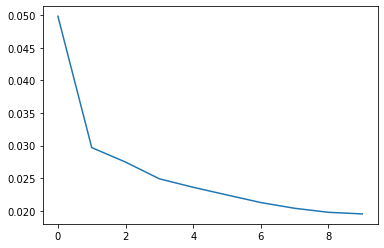

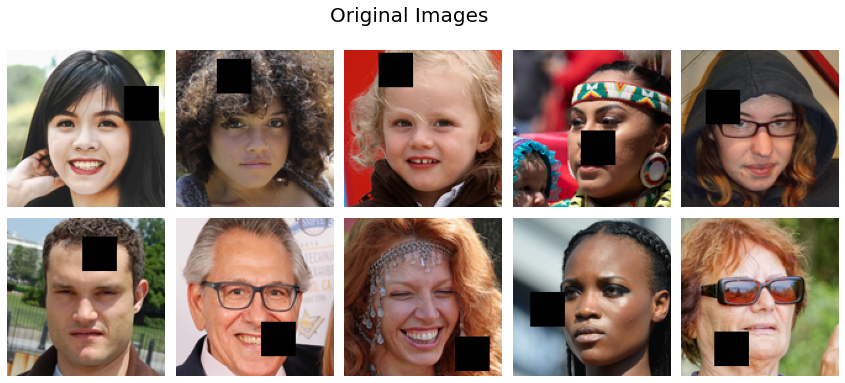

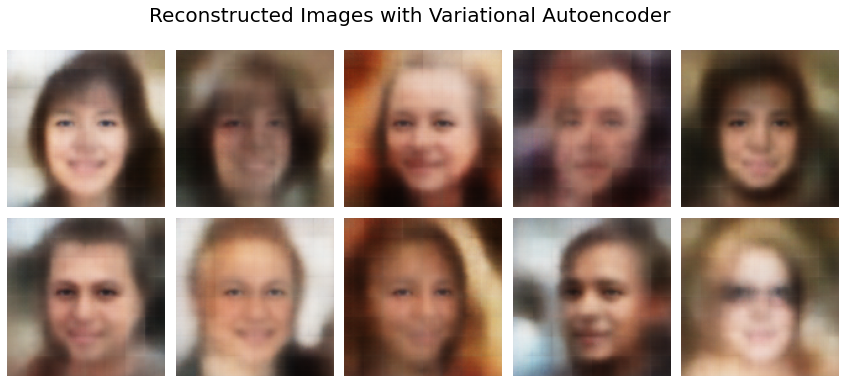

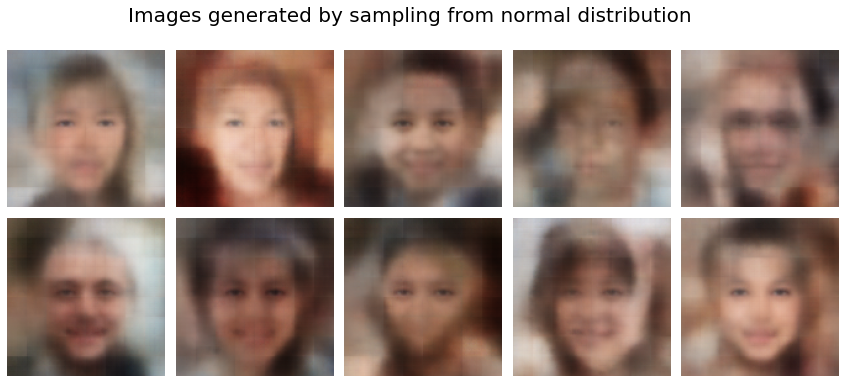

In [12]:
'''
INPUT_DIM = (128, 128, 3)
Z_DIM = 700
Number of Conv Layers = 4

-> for encoder
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

-> for decoder
filters2 = [105, 70, 35, 3]
kernels2 = [3, 3, 3, 3]
strides2 = [2, 2, 2, 2]

-> compiling and training
Optimizer = Adam
Learning Rate = 0.004
Epochs = 10
batch_size = 500

LOSS_FACTOR = 12000
'''


Z_DIM = 700

# Encoder
mean_mu = None
var = None
vae_encoder_input = Input(shape=INPUT_DIM, name='vae_encoder_input')
vae_encoder = None
vae_encoder_output = None
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae = vae_encoder_input
for i in range(4):
  vae = Conv2D(filters=filters[i], kernel_size=kernels[i], strides=strides[i], padding='same', name='vae_encoder_input_conv_layer' + str(i))(vae)
  vae = LeakyReLU()(vae)
latentVectorReshaperHelper = K.int_shape(vae)[1:]
vae = Flatten()(vae)
mean_mu = Dense(Z_DIM, name='mean_mu')(vae)
var = Dense(Z_DIM, name='var')(vae)
def sample_from_distribution(args):
  mean_mu, var = args
  epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
  return mean_mu + K.exp(var/2)*epsilon   
vae_encoder_output = Lambda(sample_from_distribution, name='encoder_output')([mean_mu, var])
vae_encoder = Model(vae_encoder_input, vae_encoder_output)

# Decoder
vae_decoder = None
vae_decoder_output = None
filters = [105, 70, 35, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae_decoder_input = Input(shape=(Z_DIM,), name='vae_decoder_input')
vae = Dense(np.prod(latentVectorReshaperHelper))(vae_decoder_input)
vae = Reshape(latentVectorReshaperHelper)(vae)
for i in range(4):
  vae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'vae_decoder_output_dense_layer' + str(i))(vae)
  if i < 4 - 1:
    vae = LeakyReLU()(vae)
  else:
    vae = Activation('sigmoid')(vae)
vae_decoder_output = vae
vae_decoder = Model(inputs=vae_decoder_input, outputs=vae_decoder_output)

# Connect Encoder and Decoder
vae_model = None
vae_input = vae_encoder_input
vae_output = vae_decoder(vae_encoder_output)
vae_model = Model(inputs=vae_input, outputs=vae_output)

# Printing Summary
vae_model.summary()
print('')
print('')

# Hyper Params
LEARNING_RATE = 0.004
N_EPOCHS = 10
LOSS_FACTOR = 12000
BATCH_SIZE = 500

# Compiling
training = custom_image_generator(filenames, 7000)
optimizer = Adam(lr=LEARNING_RATE)
vae_model.compile(optimizer=optimizer, loss=total_loss, metrics=['mse'])

# Train
hist = vae_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

# Plot Graph
print('')
print('')
print('Mean Squared Error: ', hist.history['mse'][-1])
print('')
print('')
pyplot.plot(hist.history['mse'])
print('')
print('')

# Reconstruction
test_gen = custom_image_generator(filenames, NUM_IMAGES)
test_batch = next(test_gen)[0]
test_images = test_batch[:10]
reconst_images = vae_model.predict(test_images)
display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Variational Autoencoder")
print('')
print('')

# Generation
reconst_images = vae_decoder.predict(np.random.normal(0,1,size=(10, Z_DIM)))
display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

## Model 3

Model: "model_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 40)   1120        vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu_21 (LeakyReLU)      (None, 64, 64, 40)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 80)   28880       leaky_re_lu_21[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


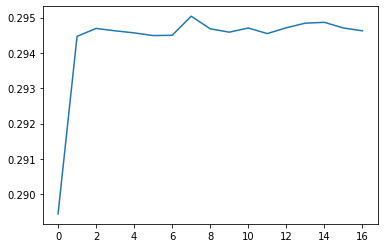

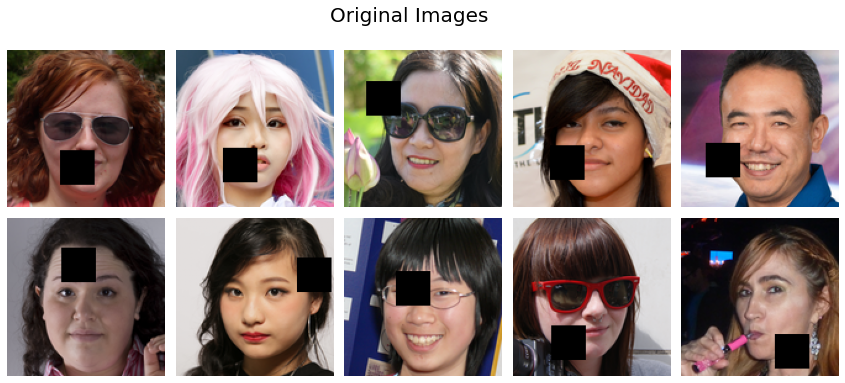

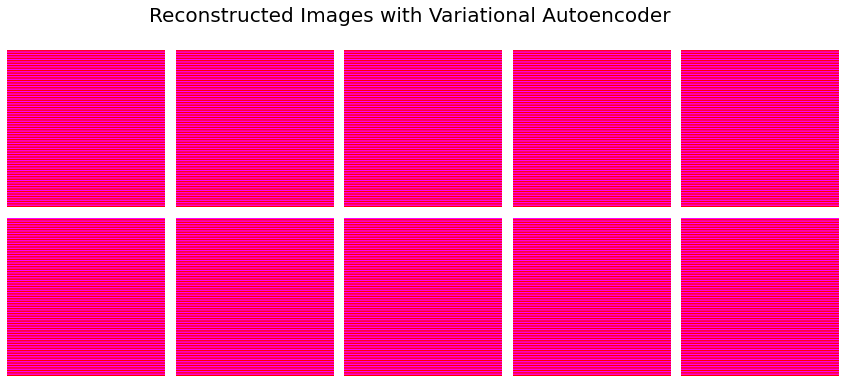

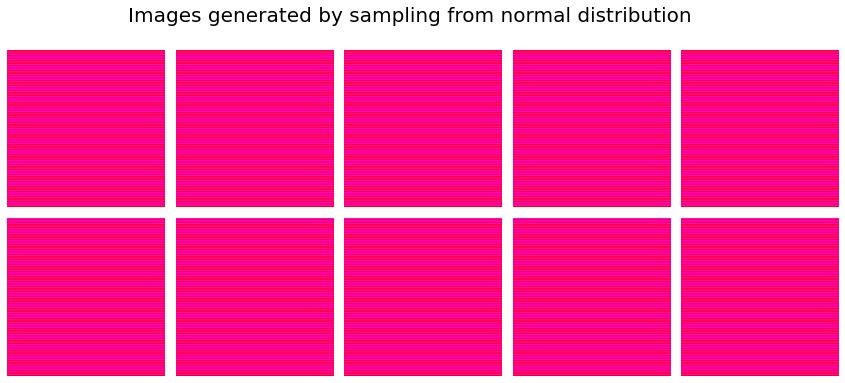

In [14]:
'''
INPUT_DIM = (128, 128, 3)
Z_DIM = 1200
Number of Conv Layers = 4

-> for encoder
filters = [40, 80, 120, 160]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

-> for decoder
filters2 = [120, 80, 40, 3]
kernels2 = [3, 3, 3, 3]
strides2 = [2, 2, 2, 2]

-> compiling and training
Optimizer = SGD
Learning Rate = 0.01
Epochs = 17
batch_size = 300

LOSS_FACTOR = 15000
'''


Z_DIM = 1200

# Encoder
mean_mu = None
var = None
vae_encoder_input = Input(shape=INPUT_DIM, name='vae_encoder_input')
vae_encoder = None
vae_encoder_output = None
filters = [40, 80, 120, 160]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae = vae_encoder_input
for i in range(4):
  vae = Conv2D(filters=filters[i], kernel_size=kernels[i], strides=strides[i], padding='same', name='vae_encoder_input_conv_layer' + str(i))(vae)
  vae = LeakyReLU()(vae)
latentVectorReshaperHelper = K.int_shape(vae)[1:]
vae = Flatten()(vae)
mean_mu = Dense(Z_DIM, name='mean_mu')(vae)
var = Dense(Z_DIM, name='var')(vae)
def sample_from_distribution(args):
  mean_mu, var = args
  epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
  return mean_mu + K.exp(var/2)*epsilon   
vae_encoder_output = Lambda(sample_from_distribution, name='encoder_output')([mean_mu, var])
vae_encoder = Model(vae_encoder_input, vae_encoder_output)

# Decoder
vae_decoder = None
vae_decoder_output = None
filters = [120, 80, 40, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae_decoder_input = Input(shape=(Z_DIM,), name='vae_decoder_input')
vae = Dense(np.prod(latentVectorReshaperHelper))(vae_decoder_input)
vae = Reshape(latentVectorReshaperHelper)(vae)
for i in range(4):
  vae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'vae_decoder_output_dense_layer' + str(i))(vae)
  if i < 4 - 1:
    vae = LeakyReLU()(vae)
  else:
    vae = Activation('sigmoid')(vae)
vae_decoder_output = vae
vae_decoder = Model(inputs=vae_decoder_input, outputs=vae_decoder_output)

# Connect Encoder and Decoder
vae_model = None
vae_input = vae_encoder_input
vae_output = vae_decoder(vae_encoder_output)
vae_model = Model(inputs=vae_input, outputs=vae_output)

# Printing Summary
vae_model.summary()
print('')
print('')

# Hyper Params
LEARNING_RATE = 0.01
N_EPOCHS = 17
LOSS_FACTOR = 15000
BATCH_SIZE = 300

# Compiling
training = custom_image_generator(filenames, 7000)
optimizer = SGD(lr=LEARNING_RATE)
vae_model.compile(optimizer=optimizer, loss=total_loss, metrics=['mse'])

# Train
hist = vae_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

# Plot Graph
print('')
print('')
print('Mean Squared Error: ', hist.history['mse'][-1])
print('')
print('')
pyplot.plot(hist.history['mse'])
print('')
print('')

# Reconstruction
test_gen = custom_image_generator(filenames, NUM_IMAGES)
test_batch = next(test_gen)[0]
test_images = test_batch[:10]
reconst_images = vae_model.predict(test_images)
display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Variational Autoencoder")
print('')
print('')

# Generation
reconst_images = vae_decoder.predict(np.random.normal(0,1,size=(10, Z_DIM)))
display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

## Model 4

Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 35)   980         vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu_28 (LeakyReLU)      (None, 64, 64, 35)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 70)   22120       leaky_re_lu_28[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


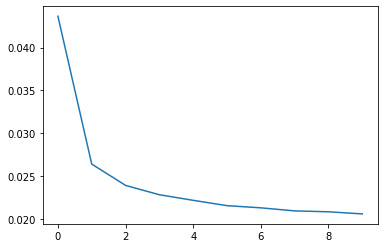

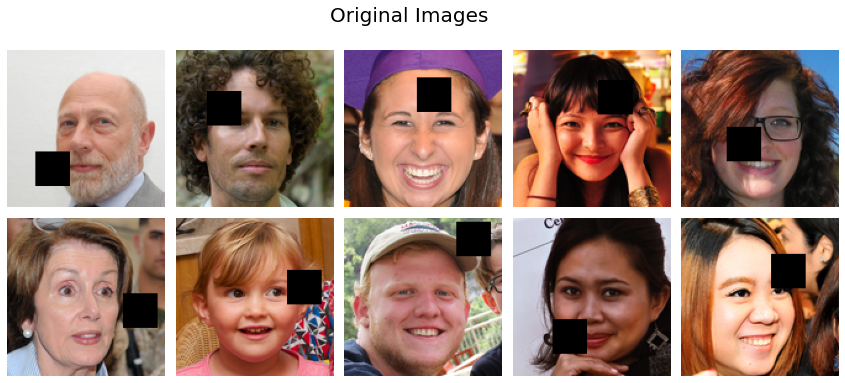

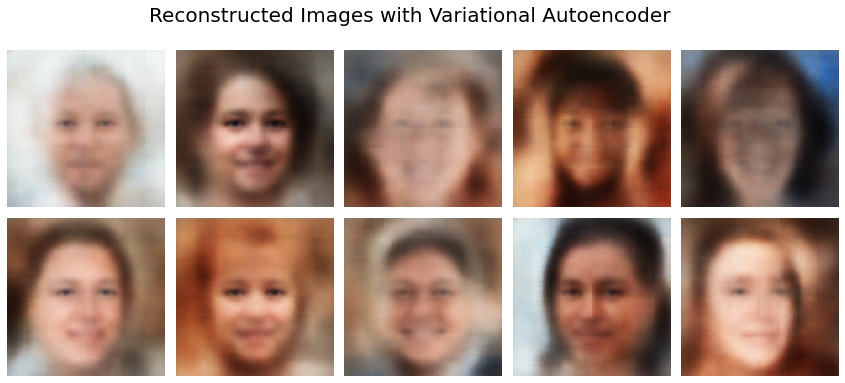

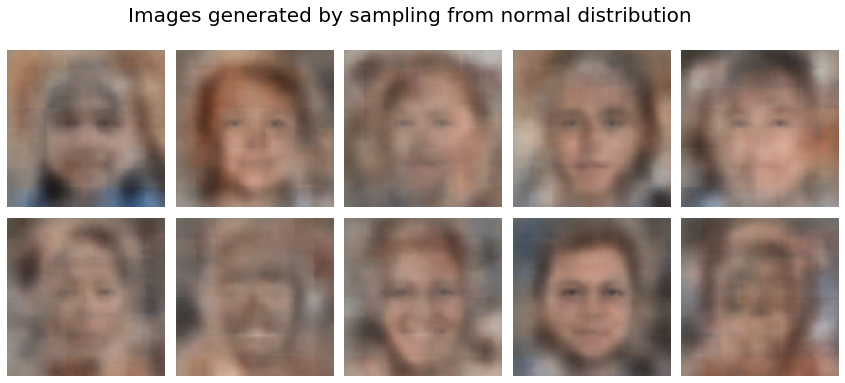

In [15]:
'''
INPUT_DIM = (128, 128, 3)
Z_DIM = 1400
Number of Conv Layers = 4

-> for encoder
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

-> for decoder
filters2 = [105, 70, 35, 3]
kernels2 = [3, 3, 3, 3]
strides2 = [2, 2, 2, 2]

-> compiling and training
Optimizer = Adam
Learning Rate = 0.0005
Epochs = 17
batch_size = 450

LOSS_FACTOR = 17000
'''


Z_DIM = 1400

# Encoder
mean_mu = None
var = None
vae_encoder_input = Input(shape=INPUT_DIM, name='vae_encoder_input')
vae_encoder = None
vae_encoder_output = None
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae = vae_encoder_input
for i in range(4):
  vae = Conv2D(filters=filters[i], kernel_size=kernels[i], strides=strides[i], padding='same', name='vae_encoder_input_conv_layer' + str(i))(vae)
  vae = LeakyReLU()(vae)
latentVectorReshaperHelper = K.int_shape(vae)[1:]
vae = Flatten()(vae)
mean_mu = Dense(Z_DIM, name='mean_mu')(vae)
var = Dense(Z_DIM, name='var')(vae)
def sample_from_distribution(args):
  mean_mu, var = args
  epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
  return mean_mu + K.exp(var/2)*epsilon   
vae_encoder_output = Lambda(sample_from_distribution, name='encoder_output')([mean_mu, var])
vae_encoder = Model(vae_encoder_input, vae_encoder_output)

# Decoder
vae_decoder = None
vae_decoder_output = None
filters = [105, 70, 35, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae_decoder_input = Input(shape=(Z_DIM,), name='vae_decoder_input')
vae = Dense(np.prod(latentVectorReshaperHelper))(vae_decoder_input)
vae = Reshape(latentVectorReshaperHelper)(vae)
for i in range(4):
  vae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'vae_decoder_output_dense_layer' + str(i))(vae)
  if i < 4 - 1:
    vae = LeakyReLU()(vae)
  else:
    vae = Activation('sigmoid')(vae)
vae_decoder_output = vae
vae_decoder = Model(inputs=vae_decoder_input, outputs=vae_decoder_output)

# Connect Encoder and Decoder
vae_model = None
vae_input = vae_encoder_input
vae_output = vae_decoder(vae_encoder_output)
vae_model = Model(inputs=vae_input, outputs=vae_output)

# Printing Summary
vae_model.summary()
print('')
print('')

# Hyper Params
LEARNING_RATE = 0.0005
N_EPOCHS = 10
LOSS_FACTOR = 17000
BATCH_SIZE = 450

# Compiling
training = custom_image_generator(filenames, 7000)
optimizer = Adam(lr=LEARNING_RATE)
vae_model.compile(optimizer=optimizer, loss=total_loss, metrics=['mse'])

# Train
hist = vae_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

# Plot Graph
print('')
print('')
print('Mean Squared Error: ', hist.history['mse'][-1])
print('')
print('')
pyplot.plot(hist.history['mse'])
print('')
print('')

# Reconstruction
test_gen = custom_image_generator(filenames, NUM_IMAGES)
test_batch = next(test_gen)[0]
test_images = test_batch[:10]
reconst_images = vae_model.predict(test_images)
display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Variational Autoencoder")
print('')
print('')

# Generation
reconst_images = vae_decoder.predict(np.random.normal(0,1,size=(10, Z_DIM)))
display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

## Model 5

Model: "model_17"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 35)   980         vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu_35 (LeakyReLU)      (None, 64, 64, 35)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 70)   22120       leaky_re_lu_35[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


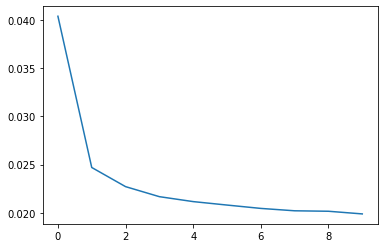

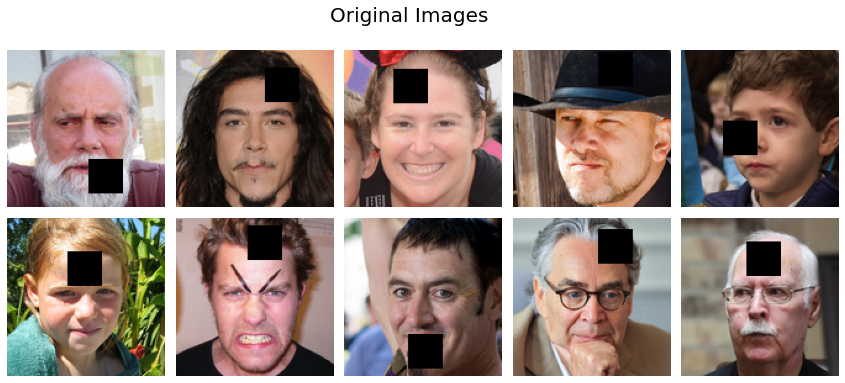

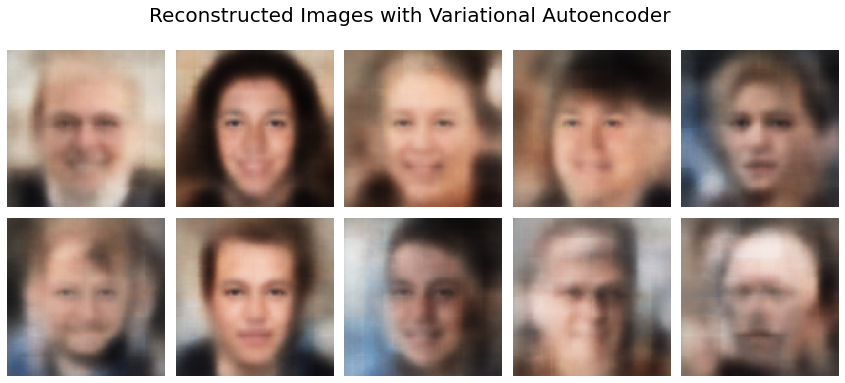

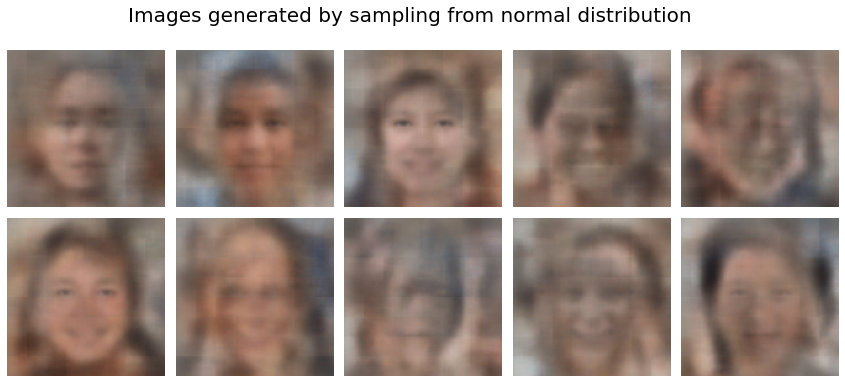

In [16]:
'''
INPUT_DIM = (128, 128, 3)
Z_DIM = 1800
Number of Conv Layers = 4

-> for encoder
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

-> for decoder
filters2 = [105, 70, 35, 3]
kernels2 = [3, 3, 3, 3]
strides2 = [2, 2, 2, 2]

-> compiling and training
Optimizer = Adam
Learning Rate = 0.0007
Epochs = 10
batch_size = 450

LOSS_FACTOR = 20000
'''


Z_DIM = 1800

# Encoder
mean_mu = None
var = None
vae_encoder_input = Input(shape=INPUT_DIM, name='vae_encoder_input')
vae_encoder = None
vae_encoder_output = None
filters = [35, 70, 105, 140]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae = vae_encoder_input
for i in range(4):
  vae = Conv2D(filters=filters[i], kernel_size=kernels[i], strides=strides[i], padding='same', name='vae_encoder_input_conv_layer' + str(i))(vae)
  vae = LeakyReLU()(vae)
latentVectorReshaperHelper = K.int_shape(vae)[1:]
vae = Flatten()(vae)
mean_mu = Dense(Z_DIM, name='mean_mu')(vae)
var = Dense(Z_DIM, name='var')(vae)
def sample_from_distribution(args):
  mean_mu, var = args
  epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
  return mean_mu + K.exp(var/2)*epsilon   
vae_encoder_output = Lambda(sample_from_distribution, name='encoder_output')([mean_mu, var])
vae_encoder = Model(vae_encoder_input, vae_encoder_output)

# Decoder
vae_decoder = None
vae_decoder_output = None
filters = [105, 70, 35, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae_decoder_input = Input(shape=(Z_DIM,), name='vae_decoder_input')
vae = Dense(np.prod(latentVectorReshaperHelper))(vae_decoder_input)
vae = Reshape(latentVectorReshaperHelper)(vae)
for i in range(4):
  vae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'vae_decoder_output_dense_layer' + str(i))(vae)
  if i < 4 - 1:
    vae = LeakyReLU()(vae)
  else:
    vae = Activation('sigmoid')(vae)
vae_decoder_output = vae
vae_decoder = Model(inputs=vae_decoder_input, outputs=vae_decoder_output)

# Connect Encoder and Decoder
vae_model = None
vae_input = vae_encoder_input
vae_output = vae_decoder(vae_encoder_output)
vae_model = Model(inputs=vae_input, outputs=vae_output)

# Printing Summary
vae_model.summary()
print('')
print('')

# Hyper Params
LEARNING_RATE = 0.0007
N_EPOCHS = 10
LOSS_FACTOR = 20000
BATCH_SIZE = 450

# Compiling
training = custom_image_generator(filenames, 7000)
optimizer = Adam(lr=LEARNING_RATE)
vae_model.compile(optimizer=optimizer, loss=total_loss, metrics=['mse'])

# Train
hist = vae_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

# Plot Graph
print('')
print('')
print('Mean Squared Error: ', hist.history['mse'][-1])
print('')
print('')
pyplot.plot(hist.history['mse'])
print('')
print('')

# Reconstruction
test_gen = custom_image_generator(filenames, NUM_IMAGES)
test_batch = next(test_gen)[0]
test_images = test_batch[:10]
reconst_images = vae_model.predict(test_images)
display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Variational Autoencoder")
print('')
print('')

# Generation
reconst_images = vae_decoder.predict(np.random.normal(0,1,size=(10, Z_DIM)))
display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

## Model 6

Model: "model_20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
vae_encoder_input (InputLayer)  [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
vae_encoder_input_conv_layer0 ( (None, 64, 64, 40)   1120        vae_encoder_input[0][0]          
__________________________________________________________________________________________________
leaky_re_lu_42 (LeakyReLU)      (None, 64, 64, 40)   0           vae_encoder_input_conv_layer0[0][
__________________________________________________________________________________________________
vae_encoder_input_conv_layer1 ( (None, 32, 32, 80)   28880       leaky_re_lu_42[0][0]             
___________________________________________________________________________________________

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


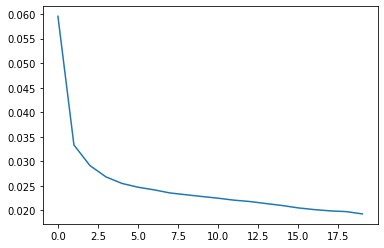

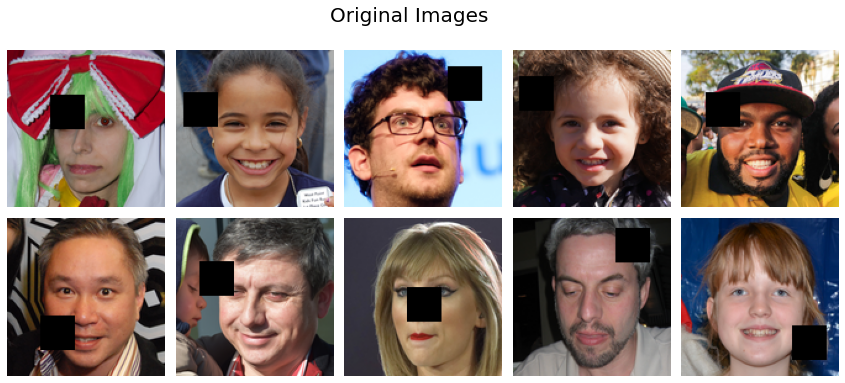

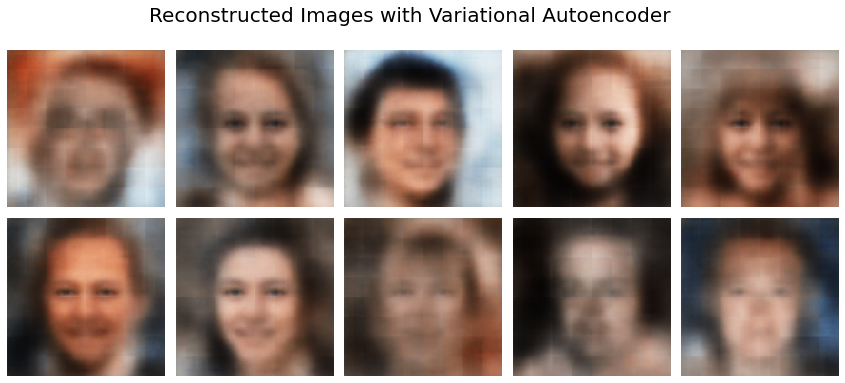

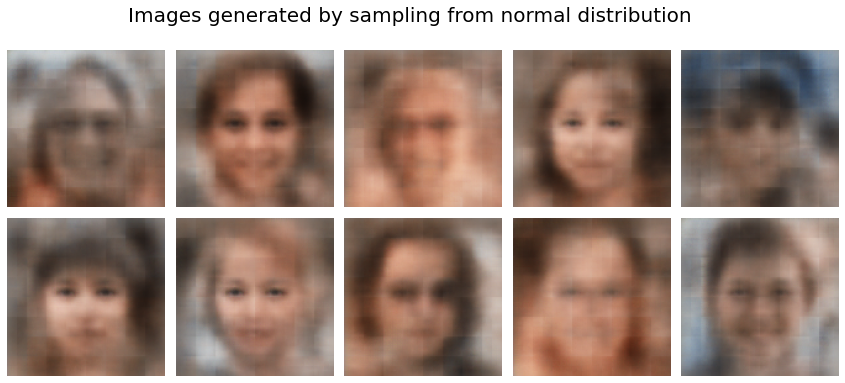

In [17]:
'''
INPUT_DIM = (128, 128, 3)
Z_DIM = 800
Number of Conv Layers = 4

-> for encoder
filters = [40, 80, 120, 160]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]

-> for decoder
filters2 = [120, 80, 40, 3]
kernels2 = [3, 3, 3, 3]
strides2 = [2, 2, 2, 2]

-> compiling and training
Optimizer = Adagrad
Learning Rate = 0.005
Epochs = 20
batch_size = 450

LOSS_FACTOR = 13000
'''


Z_DIM = 800

# Encoder
mean_mu = None
var = None
vae_encoder_input = Input(shape=INPUT_DIM, name='vae_encoder_input')
vae_encoder = None
vae_encoder_output = None
filters = [40, 80, 120, 160]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae = vae_encoder_input
for i in range(4):
  vae = Conv2D(filters=filters[i], kernel_size=kernels[i], strides=strides[i], padding='same', name='vae_encoder_input_conv_layer' + str(i))(vae)
  vae = LeakyReLU()(vae)
latentVectorReshaperHelper = K.int_shape(vae)[1:]
vae = Flatten()(vae)
mean_mu = Dense(Z_DIM, name='mean_mu')(vae)
var = Dense(Z_DIM, name='var')(vae)
def sample_from_distribution(args):
  mean_mu, var = args
  epsilon = K.random_normal(shape=K.shape(mean_mu), mean=0., stddev=1.) 
  return mean_mu + K.exp(var/2)*epsilon   
vae_encoder_output = Lambda(sample_from_distribution, name='encoder_output')([mean_mu, var])
vae_encoder = Model(vae_encoder_input, vae_encoder_output)

# Decoder
vae_decoder = None
vae_decoder_output = None
filters = [120, 80, 40, 3]
kernels = [3, 3, 3, 3]
strides = [2, 2, 2, 2]
vae_decoder_input = Input(shape=(Z_DIM,), name='vae_decoder_input')
vae = Dense(np.prod(latentVectorReshaperHelper))(vae_decoder_input)
vae = Reshape(latentVectorReshaperHelper)(vae)
for i in range(4):
  vae = Conv2DTranspose(filters = filters[i],
                      kernel_size = kernels[i],
                      strides = strides[i],
                      padding = 'same',
                      name = 'vae_decoder_output_dense_layer' + str(i))(vae)
  if i < 4 - 1:
    vae = LeakyReLU()(vae)
  else:
    vae = Activation('sigmoid')(vae)
vae_decoder_output = vae
vae_decoder = Model(inputs=vae_decoder_input, outputs=vae_decoder_output)

# Connect Encoder and Decoder
vae_model = None
vae_input = vae_encoder_input
vae_output = vae_decoder(vae_encoder_output)
vae_model = Model(inputs=vae_input, outputs=vae_output)

# Printing Summary
vae_model.summary()
print('')
print('')

# Hyper Params
LEARNING_RATE = 0.005
N_EPOCHS = 20
LOSS_FACTOR = 13000
BATCH_SIZE = 450

# Compiling
training = custom_image_generator(filenames, 7000)
optimizer = Adagrad(lr=LEARNING_RATE)
vae_model.compile(optimizer=optimizer, loss=total_loss, metrics=['mse'])

# Train
hist = vae_model.fit(training, epochs=N_EPOCHS, steps_per_epoch=int(len(filenames) / BATCH_SIZE), verbose=1)

# Plot Graph
print('')
print('')
print('Mean Squared Error: ', hist.history['mse'][-1])
print('')
print('')
pyplot.plot(hist.history['mse'])
print('')
print('')

# Reconstruction
test_gen = custom_image_generator(filenames, NUM_IMAGES)
test_batch = next(test_gen)[0]
test_images = test_batch[:10]
reconst_images = vae_model.predict(test_images)
display_image_grid(test_images, 2, 5, "Original Images")
display_image_grid(reconst_images, 2, 5, "Reconstructed Images with Variational Autoencoder")
print('')
print('')

# Generation
reconst_images = vae_decoder.predict(np.random.normal(0,1,size=(10, Z_DIM)))
display_image_grid(reconst_images, 2, 5, "Images generated by sampling from normal distribution")

## Observations

Out of the above 6 models, Models number 2 and 6 performed and reconstructed the best results and also generated faces from normal distribution to a good extent whereas Model numbered 3 gave the worst results.

When it comes to optimizers, 3 different optimizers (Adam, Adagrad, and SGD) were used. Out of all these, Adam and Adagrad gave satisfactory results whereas results with SGD proved to be the worst. 

Contrary to what happened in part 1 (epochs greater than 10 proved to be not efficient) over here epochs greater than 10 proved to be good for our model. 20 epochs gave satisfactory results.

Various increasing and decreasing filter sizes and Z_DIMS were also used but they only proved effective if other factors such as choice for optimizers were effective too. Hence, increasing Z_DIMS and filters sizes gave optimal results in Model 2 and 6.

Optimal learning rate was found to be between 0.004 and 0.005.

As mentioned before increasing the Loss Factor caused the results generated from normal distribution to be not very good. Basically if we increase Loss Factor too much we just get a simple auto encoder. Less loss factor (around 10000) produced images that were not so good. Optimal Loss Factor was found to be around 13000 to 17000.

Configurations that proved to be the best can be seen as comments in Model numbered 2 and 6 respectively.